# End-to-end multi-Class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog, given its image.

## 2. Data

We are using data from kaggle.

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

## 4. Features

Some information about the data:
* We're dealing with images (unstructured data) so use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (these images have labels)
* There are around 10,000+ images in the test set (these images have no labels)


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
#!unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision/"

In [3]:
# import tensorflow into colab, tensorflow hub
import tensorflow_hub as hub
import tensorflow as tf
print("TF version: ",tf.__version__)
print("Hub version: ",hub.__version__)

# Check for GPU availability
print("GPU","available" if tf.config.list_physical_devices("GPU") else "not available")


TF version:  2.13.0
Hub version:  0.14.0
GPU available


## Getting our data ready (turning images into Tensors(Numerical representations))

In [4]:
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


<Axes: >

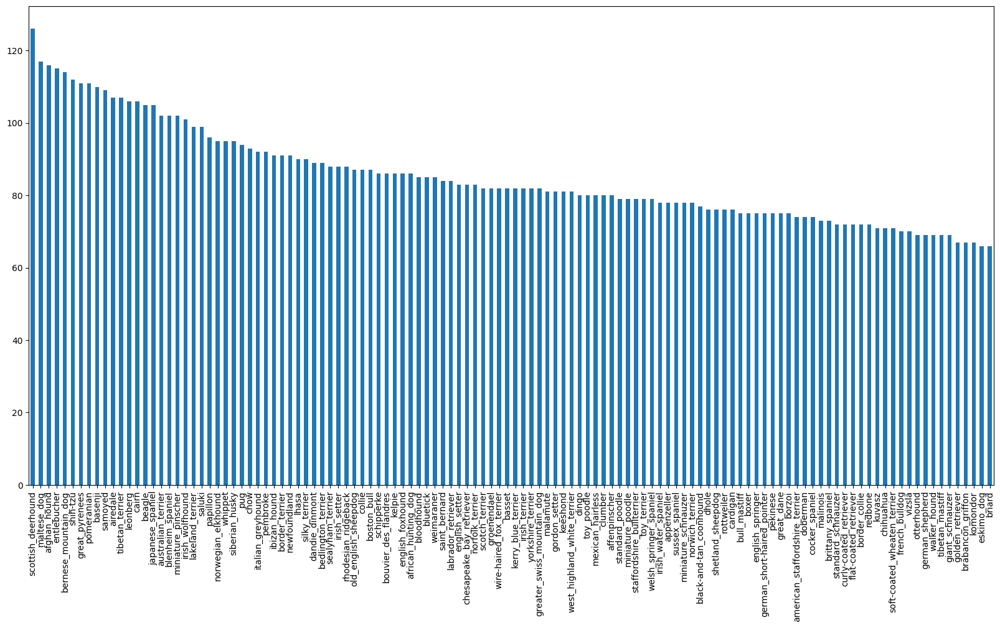

In [5]:
# images of each breed
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [6]:
labels_csv["breed"].value_counts().median()

82.0

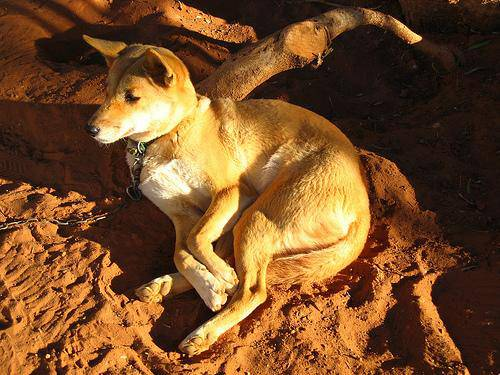

In [7]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

## Getting images and their labels

In [8]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [9]:
# Create path name from image ID
filenames=["drive/MyDrive/Dog Vision/train/"+fname+".jpg" for fname in labels_csv["id"]]
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [10]:
# Check whether number of file names matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual amount of files.")
else:
  print("Filenames do not match actual amount of files.")

Filenames match actual amount of files.


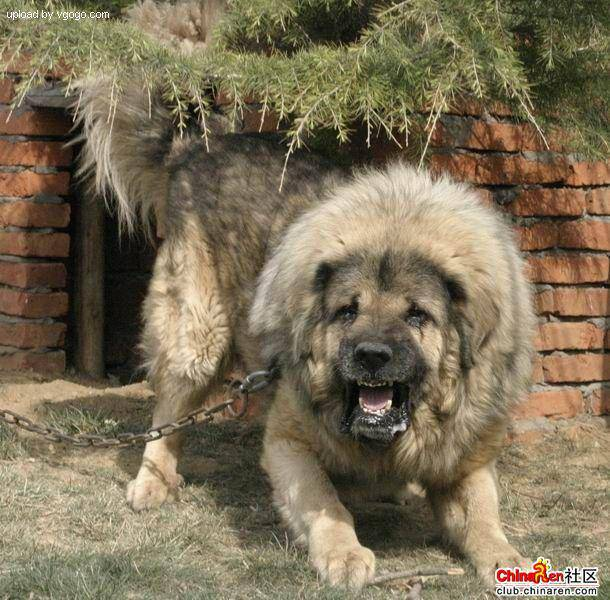

In [11]:
Image(filenames[9000])

In [12]:
labels_csv["breed"][9000]

'tibetan_mastiff'

In [13]:
import numpy as np
labels= labels_csv["breed"]
labels= np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [14]:
len(labels)

10222

In [15]:
# Check if number of labels matches the number of filenames
if len(labels)==len(filenames):
  print("Number of labels matches number of filenames")
else:
  print("Number of labels does not match number of filenames")

Number of labels matches number of filenames


In [16]:
# find the unique label values
unique_breeds= np.unique(labels)
len(unique_breeds)

120

In [17]:
# turn a single label into an array of booleans
print(labels[0])
labels[0]== unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [18]:
# Turn every label into a boolean array
boolean_labels= [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [19]:
len(boolean_labels)

10222

In [20]:
# Turning boolean array into integers
print(labels[0])
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [21]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set

In [22]:
# Setup X and y variables
X= filenames
y= boolean_labels

In [23]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [24]:
# Splitting data into train and validation
from sklearn.model_selection import train_test_split

X_train,X_val,y_train,y_val = train_test_split(X[:NUM_IMAGES],y[:NUM_IMAGES],
                                               test_size=0.2,
                                               random_state=42)
len(X_train),len(y_train),len(X_val),len(y_val)

(800, 800, 200, 200)

In [25]:
X_train[:5],y_train[:1]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

### Preprocessing Images (Turning images into Tensors)

Create a function that does the following:
1. Take an image filepath as input
2. Use tenforflow to read the file and save it to variable, 'image'
3. Turn our 'image' into Tensors
4. Resize the image to be a shape of (224,224)
5. Return the modified image

In [26]:
# Convert image to numpy
from matplotlib.pyplot import imread
image= imread(filenames[42])
image.shape

(257, 350, 3)

In [27]:
# Turn image into tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [28]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, IMG_SIZE=IMG_SIZE):

  # read in an image file
  image= tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 color channels (rgb)
  image = tf.image.decode_jpeg(image,channels=3)
  # Convert the color channel values from 0-255 to 0-1 values...Normalization
  image = tf.image.convert_image_dtype(image,tf.float32)
  # Resize the image to (224,224)
  image= tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])

  return image


## Turning our data into batches

In [29]:
# Create a function to return tuple of tensors (image,label)
def get_image_label(image_path,label):
  image= process_image(image_path)
  return image, label

In [30]:
(process_image(X[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

##### Function to turn all our data (X & y) into batches

In [31]:
# Define the batch size
BATCH_SIZE = 32

# Function to turn data to batches
def create_data_batches(X,y=None,batch_size=BATCH_SIZE, valid_data=False,test_data=False):

  # If the data is test data, we have no labels.
  if test_data:
    print("Creating test data batches...")
    data= tf.data.Dataset.from_tensor_slices((tf.constant(X))) # Only filepaths no labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))  # Both filepath and labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data= tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                             tf.constant(y)))

    # Shuffle pathnames and labels before mapping image processor function
    data = data.shuffle(buffer_size=len(X))

    # Create (image,labels) tuples (this also turns the image path into a preprocessed image)
    data= data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)

    return data_batch


In [32]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data= create_data_batches(X_val,y_val,valid_data=True)

Creating training data batches...
Creating validation data batches...


In [33]:
# Check out the different attributes of data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing Data Batches

In [34]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch

def show_25_images(images,labels):
  """
  Displays a plot of 25 images and their labels from a data batch.

  """
  plt.figure(figsize=(10,10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots
    ax= plt.subplot(5,5,i+1)  # rows,columns,index
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # turn the grid lines off
    #plt.axis("off")

In [35]:
train_images, train_labels= next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[5.25805354e-01, 5.57177901e-01, 4.98354375e-01],
          [5.40641129e-01, 5.72013676e-01, 5.21033287e-01],
          [5.26494563e-01, 5.53945541e-01, 5.22572994e-01],
          ...,
          [3.45415980e-01, 2.81445384e-01, 1.08944289e-01],
          [3.49760622e-01, 2.87925780e-01, 1.10107198e-01],
          [3.20107460e-01, 2.83630818e-01, 9.73739475e-02]],
 
         [[5.11337221e-01, 5.42709768e-01, 4.83886242e-01],
          [5.30847371e-01, 5.62219918e-01, 5.11239529e-01],
          [5.20850837e-01, 5.48301816e-01, 5.16929269e-01],
          ...,
          [1.38189852e-01, 2.68066972e-02, 1.12377852e-02],
          [1.36116892e-01, 2.66767293e-02, 1.28241703e-02],
          [1.47636682e-01, 5.44641316e-02, 1.19047537e-02]],
 
         [[5.25391638e-01, 5.56764185e-01, 4.97940600e-01],
          [5.38058519e-01, 5.69431067e-01, 5.18450677e-01],
          [5.22432446e-01, 5.49883425e-01, 5.18510878e-01],
          ...,
          [3.59623507e-02, 1.80322062e-02, 1.4425

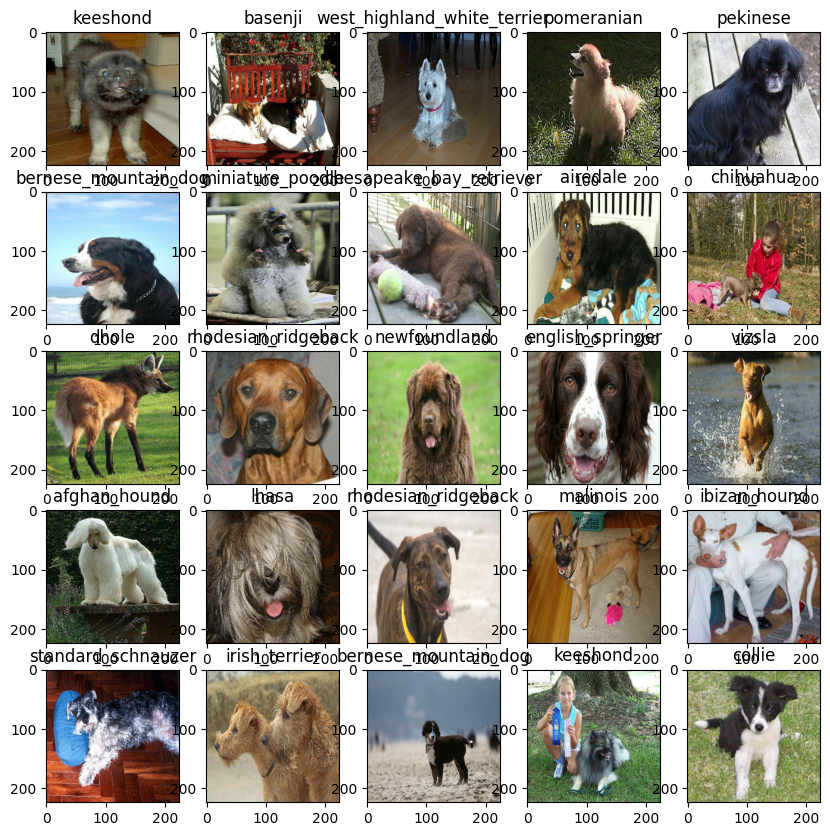

In [36]:
show_25_images(train_images,train_labels)

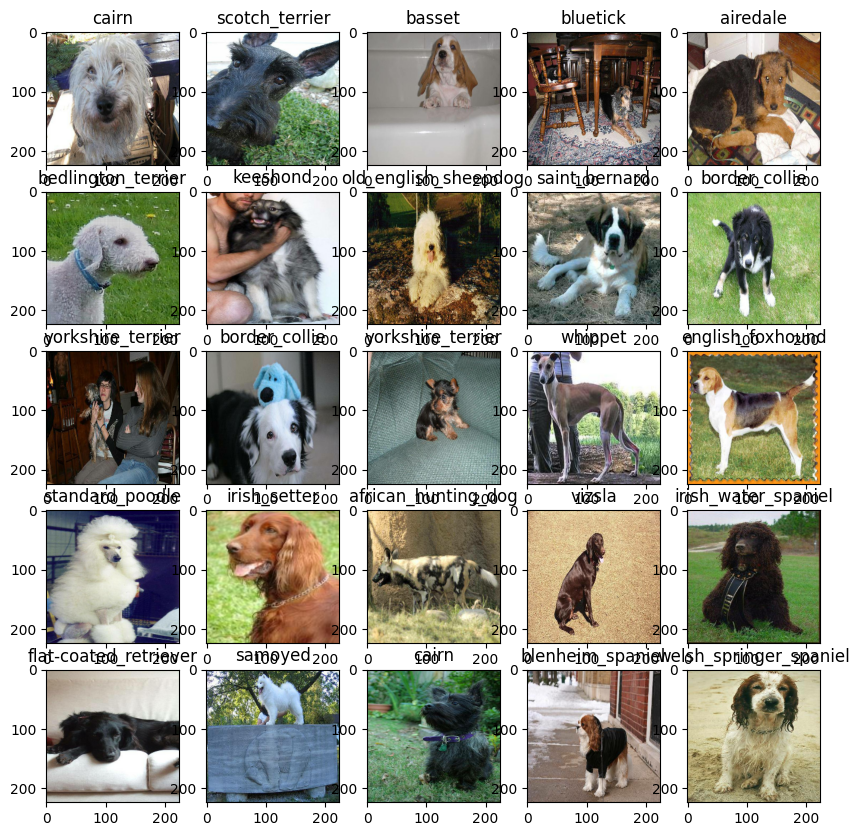

In [37]:
val_images,val_labels= next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

## Building a model

We need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use.
* https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [38]:
# Setup input shape
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batxh, height, width, color channels

# Setup the output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from Tensorflow hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"




Creating a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a keras model in sequential fashion.
* Compiles the model (says it should be evaluated and improved).
* Builds the model.
* Returns the model.

In [39]:
# Function to build a keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("Building model with: ",MODEL_URL)

  # Setup model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL),   # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax")    # Layer 2 (output layer)
  ])
  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),  # The well the model is guessing
      optimizer=tf.keras.optimizers.Adam(),   # Adam optimizer- minimizing loss
      metrics=["accuracy"]
  )
  # Build the model
  model.build(INPUT_SHAPE)

  return model


In [40]:
model= create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [41]:
outputs= np.ones(shape=(1,1,1280))
outputs

array([[[1., 1., 1., ..., 1., 1., 1.]]])

## Creating Callbacks

Callbacks are helper functions a model can use during training to do such things as saveits progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard (dashboard to see how well is the model doing, if the loss function is getting reduced) which helps track our models progress and another for early stopping which prevents our model from training for too long.

## TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension.
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's 'fit()' function.
3. Visualize our model's training logs with the '%tensorboard' magic function (after model training).

In [42]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [43]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory.
  logdir= os.path.join("drive/MyDrive/Dog Vision/logs",
                       datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

In [44]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Trainjng a model (on subset of data)

Training on 1000 images

In [60]:
!pip install --upgrade tensorflow


In [45]:
NUM_EPOCHS = 100 #@param{type:"slider",min:10,max:100,step:10}

In [46]:
# GPU
print("GPU","available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


Function to train the model

* Create a model using create_model()
* Setup a TensorBoard callback using create_tensorboard_callback()
* Call the fit() function on our model passing it the training data,validation data, number of epochs to train (NUM_EPOCHS) and the callbacks
* Return the model

In [58]:
def train_model():
   model = create_model()

   tensorboard = create_tensorboard_callback()  # Tensorboard session every time we train the model

   # fit the model
   model.fit(x=train_data,
             epochs=NUM_EPOCHS,
             validation_data=val_data,
             validation_freq=1,
             callbacks=[tensorboard,early_stopping])
   return model




In [56]:
from google.colab import drive
drive.mount('/content/gdrive')
!ln -s "/content/gdrive/MyDrive" "/content/mydrive"
import os
os.chdir("/content/drive/MyDrive/Dog Vision")
!chmod 755 ./scripts/run_local.sh
!./scripts/run_local.sh nets/resnet_at_cifar10_run.py

Mounted at /content/gdrive
chmod: cannot access './scripts/run_local.sh': No such file or directory
/bin/bash: line 1: ./scripts/run_local.sh: No such file or directory


In [68]:
# Fit the model to the data
model = train_model()

In [49]:
!fusermount -u drive
!google-drive-ocamlfuse drive

/bin/bash: line 1: google-drive-ocamlfuse: command not found


In [50]:
# !pip install piexif

In [51]:
print("GPU","available" if tf.config.list_physical_devices("GPU") else "not available")


GPU available


In [52]:
# import os

# # Define the directory path
# log_dir = 'drive/MyDrive/Dog Vision/logs'

# # Create the directory if it doesn't exist
# if not os.path.exists(log_dir):
#     os.makedirs(log_dir)


In [53]:
#!pip install --upgrade tensorflow


In [69]:
#  import keras
# import tensorflow as tf
# # from tf.keras.callbacks import TensorBoard
# from tensorflow.keras.callbacks import TensorBoard


# # Define the TensorBoard callback with the correct log directory
# tensorboard_callback = TensorBoard(log_dir=log_dir)

# # Fit the model to the data and pass the tensorboard_callback to the callbacks parameter
# model.fit(train_images, train_labels, epochs=100, callbacks=[tensorboard_callback])from tensorflow


## Tensorboard Logs

In [63]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

In [66]:
predictions = model.predict(val_data,
                            verbose=1)
predictions

In [67]:
index=0
print(predictions(index))
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")